<a href="https://colab.research.google.com/github/ArtemKostenov/-/blob/master/main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import files
files.upload()

Saving G0016169.JPG to G0016169.JPG
Saving G0011527.JPG to G0011527.JPG
Saving G0016209.JPG to G0016209.JPG
Saving G0010119.JPG to G0010119.JPG
Saving G0010769.JPG to G0010769.JPG
Saving G0011556.JPG to G0011556.JPG
Saving G0016095.JPG to G0016095.JPG
Saving G0011491.JPG to G0011491.JPG
Saving G0027694.JPG to G0027694.JPG
Saving G0027505.JPG to G0027505.JPG
Saving G0027317.JPG to G0027317.JPG
Saving G0027231.JPG to G0027231.JPG


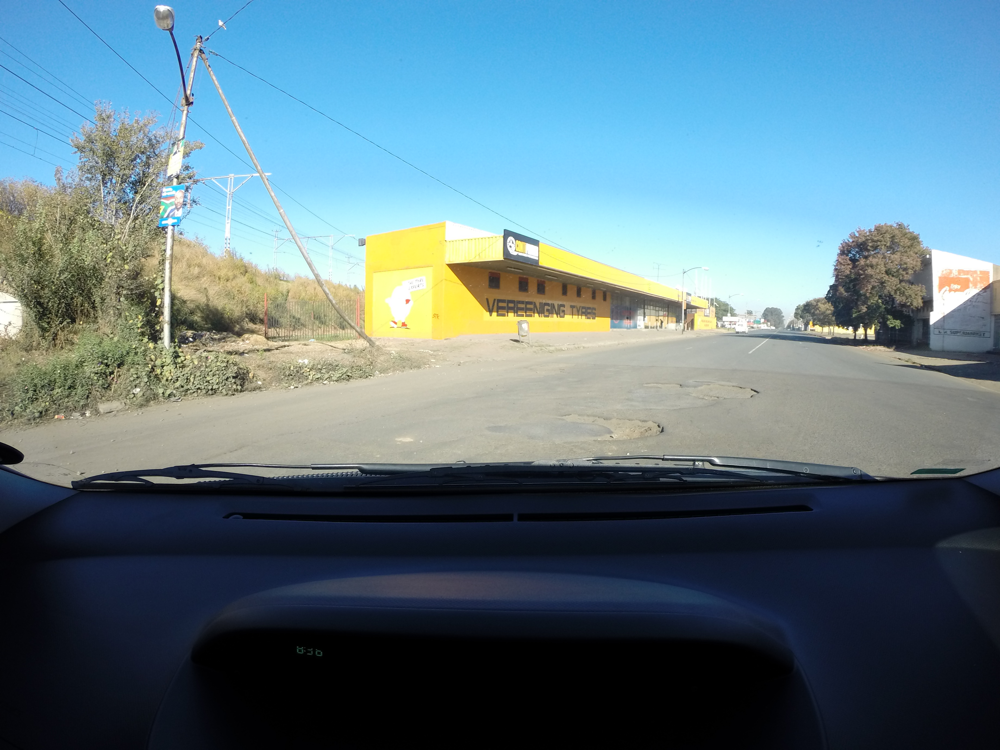

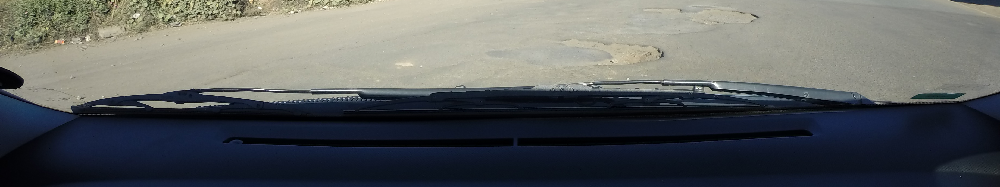

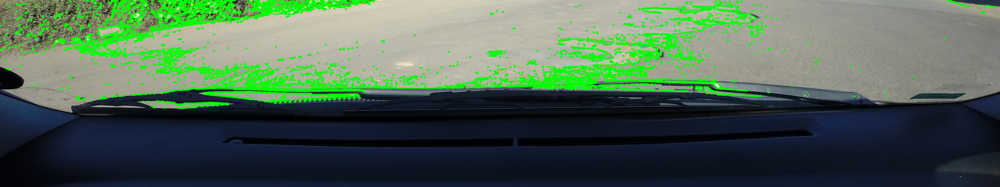

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

# чтение изображения
image = cv2.imread('9.JPG')

# вывод исходного изображения
cv2_imshow(image)

# изменение размеров изображения(обрезка в 4 раза(только дорого перед машиной на близком расстоянии))
h, w, channels = image.shape
half = h//2
bottom = image[half:, :]

h1, w1, channels = bottom.shape
half1 = h1//2
top = bottom[:half1, :]

image = top 

# вывод лобрезанного изображения
cv2_imshow(image)

# преобразование изображения в полутоновый формат
img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# двоичное пороговое преобразование
ret, thresh = cv2.threshold(img_gray, 170, 255, cv2.THRESH_BINARY)

# применение фильтра Гаусса
canny = cv2.GaussianBlur(thresh, (5,5), 0)

# применение функции Canny() для получения более чётких краёв изображения
canny = cv2.Canny(canny, 50,250)

# определение контуров на бинарном изображении
contours, hierarchy = cv2.findContours(image=canny, mode=cv2.RETR_TREE, 
                                      method=cv2.CHAIN_APPROX_NONE)

# перенос контуров на обрезанное изображение
image_copy = image.copy()
cv2.drawContours(image=image_copy, contours=contours, contourIdx=-1, 
                 color=(0, 255, 0), thickness=2, lineType=cv2.LINE_AA)

# вывод результата
cv2_imshow(image_copy)
cv2.waitKey(0)
cv2.imwrite('result.JPG', image_copy)
cv2.destroyAllWindows()